In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier, Fourier
from statsmodels.graphics.tsaplots import seasonal_plot
from scipy.signal import periodogram
from statsmodels.graphics.tsaplots import plot_pacf
import math
from math import sqrt
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

In [2]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [3]:
import os

In [4]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [5]:
from warnings import simplefilter

In [6]:
weather_data = pd.read_csv("Train_data.csv")
weather_data.head()

,Unnamed: 0,STATION,NAME,DATE,AWND,PRCP,SNOW,SNWD,TAVG,TMAX,TMIN
0,0,USW00023174,"LOS ANGELES INTERNATIONAL AIRPORT, CA US",1972-07-01,NaN,0.0,0.0,0.0,NaN,73.0,62.0
1,1,USW00023174,"LOS ANGELES INTERNATIONAL AIRPORT, CA US",1972-07-02,NaN,0.0,0.0,0.0,NaN,71.0,62.0
2,2,USW00023174,"LOS ANGELES INTERNATIONAL AIRPORT, CA US",1972-07-03,NaN,0.0,0.0,0.0,NaN,70.0,61.0
3,3,USW00023174,"LOS ANGELES INTERNATIONAL AIRPORT, CA US",1972-07-04,NaN,0.0,0.0,0.0,NaN,73.0,61.0
4,4,USW00023174,"LOS ANGELES INTERNATIONAL AIRPORT, CA US",1972-07-05,NaN,0.0,0.0,0.0,NaN,72.0,60.0


In [7]:
weather_data.isnull().sum(axis=0)

Unnamed: 0        0
STATION           0
NAME              0
DATE              0
AWND           4204
PRCP              0
SNOW           9118
SNWD           8449
TAVG          12219
TMAX              0
TMIN              0
dtype: int64

In [8]:
weather_data = weather_data[["DATE", "TMIN", "TMAX"]]

In [9]:
weather_data.columns = ["Date", "TMin", "TMax"]

In [10]:
#Data to Kelvin
weather_data.loc[:, "TMinK"] = ((weather_data["TMin"] -32)*5/9 + 273.15).map(lambda x : int(x))
weather_data.loc[:, "TMaxK"] = ((weather_data["TMax"] -32)*5/9 + 273.15).map(lambda x : int(x))

#Data to Celcius
weather_data.loc[:, "TMinC"] = ((weather_data["TMin"] -32)*5/9).map(lambda x : int(x))
weather_data.loc[:, "TMaxC"] = ((weather_data["TMax"] -32)*5/9).map(lambda x : int(x))
 
#Data to Fahrenhait
weather_data.loc[:, "TMinF"] = ((weather_data["TMin"]).map(lambda x : int(x)))
weather_data.loc[:, "TMaxF"] = ((weather_data["TMax"]).map(lambda x : int(x)))

In [11]:
weather_data

,Date,TMin,TMax,TMinK,TMaxK,TMinC,TMaxC,TMinF,TMaxF
0,1972-07-01,62.0,73.0,289,295,16,22,62,73
1,1972-07-02,62.0,71.0,289,294,16,21,62,71
2,1972-07-03,61.0,70.0,289,294,16,21,61,70
3,1972-07-04,61.0,73.0,289,295,16,22,61,73
4,1972-07-05,60.0,72.0,288,295,15,22,60,72
5,1972-07-06,62.0,75.0,289,297,16,23,62,75
6,1972-07-07,62.0,79.0,289,299,16,26,62,79
7,1972-07-08,64.0,79.0,290,299,17,26,64,79
8,1972-07-09,62.0,74.0,289,296,16,23,62,74
9,1972-07-10,61.0,75.0,289,297,16,23,61,75


In [12]:
#Global Variables
colors = ["Orange", "Blue"]
skip_days = 50 #Plot once for 50 days to reduce x density
x_tick_step = 11 #There will be 11 labels in total in the plot

In [13]:
unit = "C"

In [14]:
weather_data = weather_data[["Date", "TMin"+unit,     "TMax" + unit]]

In [15]:
weather_data = weather_data.set_index("Date")

In [16]:
#Some plot Stylings
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11,4),
    titlesize=18,
    titleweight='bold'
    )
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
    )
plot_params = dict(
    color = "0.75",
    style = ".-",
    markeredgecolor = "0.25",
    markerfacecolor = "0.25",
    legend = False,
    )
%config InlineBackend.figure_format = 'retina'

C:\Users\praka\AppData\Local\Temp\ipykernel_1924\4249456441.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


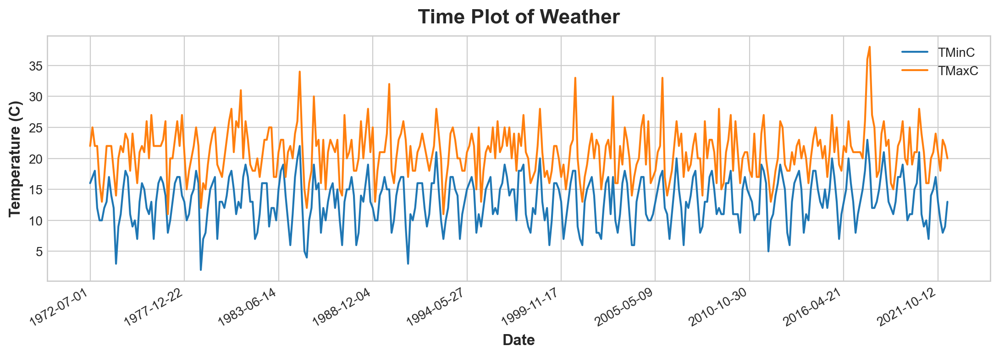

In [17]:
fig, ax = plt.subplots()
for i, col in enumerate(weather_data.columns):
    #Plot temperature against date
    ax.plot(weather_data[::skip_days].index, col, data=weather_data[::skip_days])
    
#Set labels
ax.set_xlabel("Date")
ax.set_ylabel("Temperature ("+unit+")")

#Set ticks
ax.xaxis.set_major_locator(plt.MaxNLocator(x_tick_step))

ax.legend()
fig.autofmt_xdate()
ax.set_title('Time Plot of Weather');

In [18]:
#Trend
dp_trend = DeterministicProcess(
    index = weather_data[::].index, #Date Values
    constant = True, #Bias
    order = 1,  #Linear Trend
    drop = True  #Drop terms if necessary to avoid collinearity
    )

#in_sample creates features for the dates given in the 'index' argument
X = dp_trend.in_sample()

In [19]:
#Generating Trend Line

#Creating targets
y_min = weather_data["TMin"+unit][::]
y_max = weather_data['TMax'+unit][::]

#Defining models
model_min_trend = LinearRegression(fit_intercept = False)
model_max_trend = LinearRegression(fit_intercept = False)

#Fitting MOdels
model_min_trend.fit(X, y_min)
model_max_trend.fit(X, y_max)

#Getting prediction from the model
Min_prediction_trend = pd.Series(model_min_trend.predict(X), index = X.index,name = "Min Prediction")
Max_prediction_trend = pd.Series(model_max_trend.predict(X), index = X.index,name = "Max Prediction")

#Concatenating predictions into a single dataframe
y_pred_trend = pd.concat([Max_prediction_trend, Min_prediction_trend], axis = 1)

Text(0.5, 1.0, 'Time Plot of Weather')

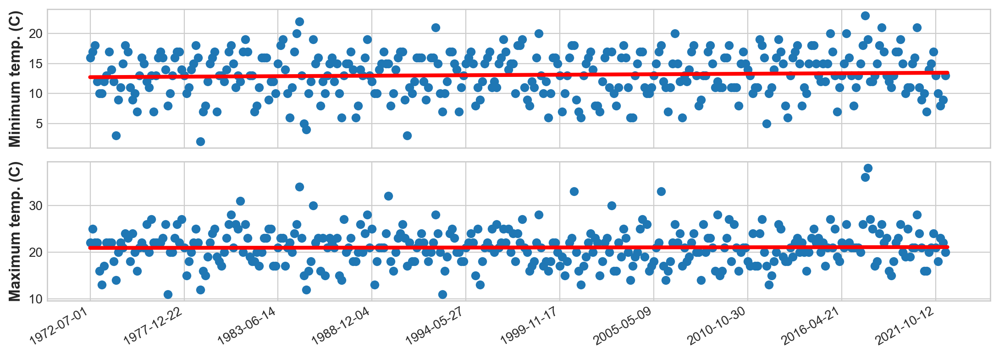

In [20]:
fig, axes = plt.subplots(2)
cols_0 = ["TMin" + unit, "TMax"+unit] #for Processing
cols = ["Min Prediction", "Max Prediction"] #for Graphing
y_labels = ["Minimum temp. ("+unit+")", "Maximum temp. ("+unit+")"]

for i, col in enumerate(cols):
    axes[i].plot(y_pred_trend[col], color="red", linewidth=3)
    
    #plot once for each (skip_days) days
    axes[i].scatter(weather_data[::skip_days].index, weather_data[::skip_days][cols_0[i]])
    axes[i].set_ylabel(y_labels[i])
    axes[i].xaxis.set_major_locator(plt.MaxNLocator(x_tick_step))
    
fig.autofmt_xdate()
ax.set_title('Time Plot of Weather')    

<AxesSubplot: xlabel='Date'>

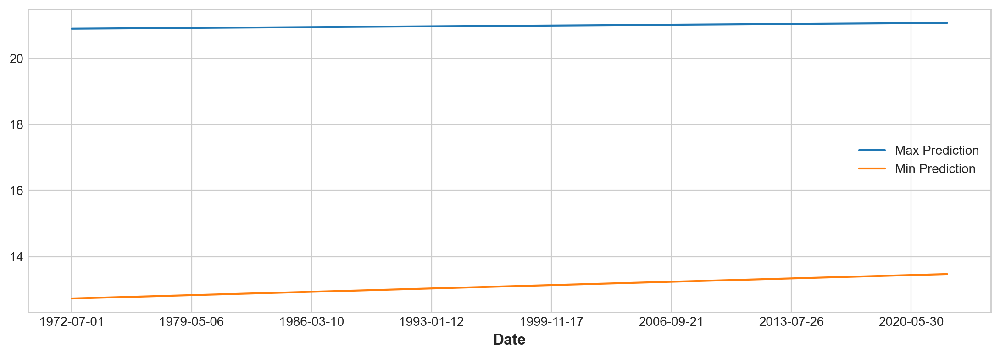

In [21]:
y_pred_trend.plot()

In [22]:
print(model_min_trend.coef_)
print(model_max_trend.coef_)

[1.27331897e+01 4.04300170e-05]
[2.09014756e+01 9.62664582e-06]


In [23]:
#Seasonality
def plot_periodogram(ts, detrend='linear', ax=None):
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs = fs,
        detrend = detrend,
        window = "boxcar",
        scaling = 'spectrum',
        )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color = "purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation = 30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

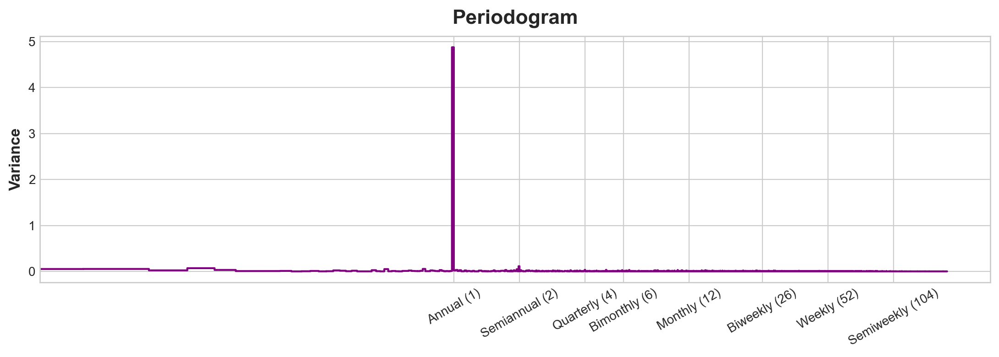

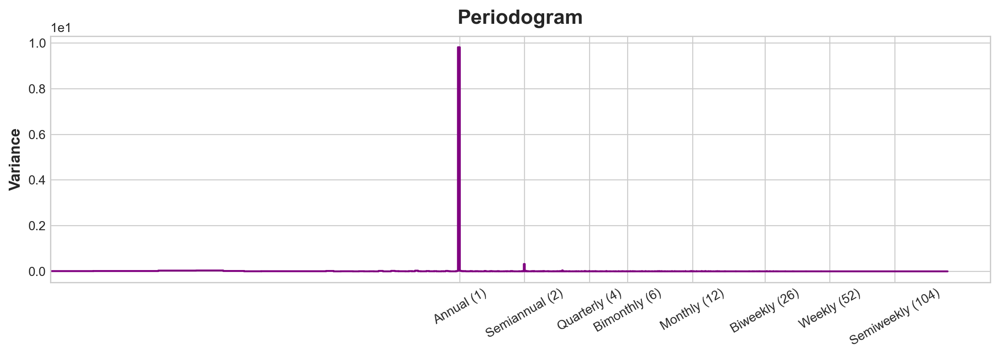

In [24]:
simplefilter("ignore") #Clean the output warnings
plot_periodogram(weather_data["TMax"+unit])
plt.show()
plot_periodogram(weather_data["TMin"+unit])
plt.show()

In [25]:
weather_data.index = weather_data.index.map(lambda x: pd.to_datetime(x))

In [26]:
fourier = CalendarFourier(freq="A", order=12) #12 sin/cos pairs for "A"nnual seasonality

dp_seasonal = DeterministicProcess(
    index = weather_data.index.to_period(),
    constant = True,    #dummy feature for bias (y-intercept)
    order = 1,
    additional_terms = [fourier],
    drop = True
)

X = dp_seasonal.in_sample()

In [27]:
#Defining targets
y_max = weather_data["TMax"+unit]
y_min = weather_data["TMin"+unit]

#defining models
model_max_seasonal = LinearRegression(fit_intercept = False)
model_min_seasonal = LinearRegression(fit_intercept = False)

#Fitting models over existing data
model_max_seasonal.fit(X, y_max)
model_min_seasonal.fit(X, y_min)

#Defining Forecast Horison
X_fore = dp_seasonal.out_of_sample(steps=200)

#making predictions on historical data
y_pred_max_seasonal = pd.Series(model_max_seasonal.predict(X), index = y_max.index)
y_pred_min_seasonal = pd.Series(model_min_seasonal.predict(X), index = y_min.index)

#Making forecasts
y_fore_max = pd.Series(model_max_seasonal.predict(X_fore), X_fore.index)
y_fore_min = pd.Series(model_min_seasonal.predict(X_fore), X_fore.index)

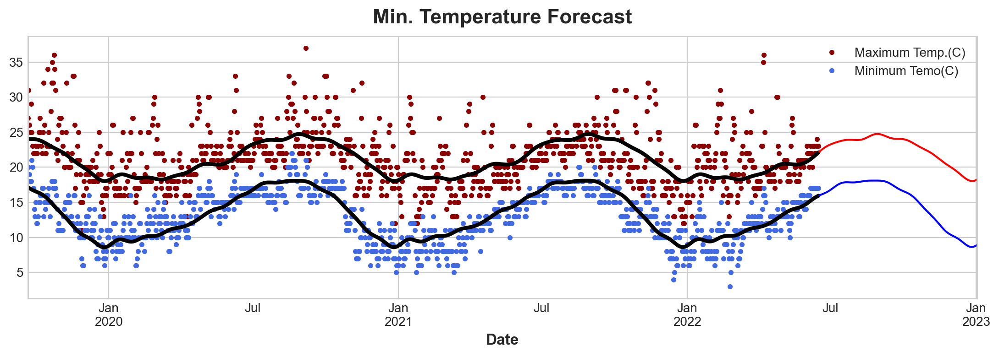

In [28]:
#Plotting
##Plotting last 1000 days to clearly see the data

###Drawing scatter points
ax = y_max[-1000:].plot(style=".", title="Max. Temperature Forecast", color="darkred")
ax = y_min[-1000:].plot(style=".", title="Min. Temperature Forecast", color="royalblue")

#Drawing the historically fitted lines
ax = y_pred_max_seasonal[-1000:].plot(ax=ax, label="Seasonal", linewidth=3, color="black")
ax = y_pred_min_seasonal[-1000:].plot(ax=ax, label="Seasonal", linewidth=3, color="black")

###plotting next 200 day forecast in red
ax = y_fore_max.plot(ax = ax, label="Seasonal Forecast", color="red")
ax = y_fore_min.plot(ax = ax, label="Seasonal Forecast", color="blue")
plt.legend(["Maximum Temp.("+unit+")", f"Minimum Temo({unit})"],loc=1)

In [29]:
#Detrending

#defining Targets
y_pred_trend_max = y_pred_trend["Max Prediction"]
y_pred_trend_min = y_pred_trend["Min Prediction"]

In [30]:
#changing indexes of series to datetime
y_pred_trend_max.index = y_pred_trend_max.index.map(pd.to_datetime)
y_pred_trend_min.index = y_pred_trend_min.index.map(pd.to_datetime)
y_max.index = y_max.index.map(pd.to_datetime)
y_min.index = y_min.index.map(pd.to_datetime)

In [31]:
#Finding detrended series by substracting the trend lines from the data
y_detrended_max = y_max - y_pred_trend_max
y_detrended_min = y_min - y_pred_trend_min

<AxesSubplot: xlabel='Date'>

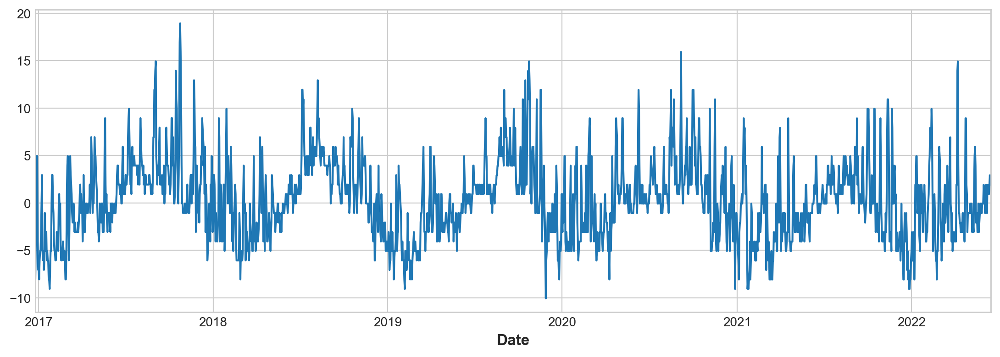

In [32]:
#plotting last 2000 days to see the seasonality better
y_detrended_max[-2000:].plot()

<AxesSubplot: xlabel='Date'>

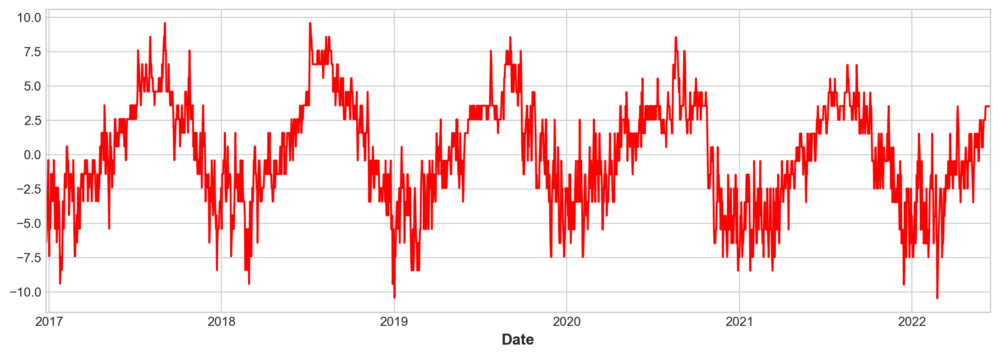

In [33]:
y_detrended_min[-2000:].plot(color="red")

In [34]:
fourier = CalendarFourier(freq="A", order=12) #12 sin/cos pairs for "A"nnual seasonality
dp_detrended_seasonal = DeterministicProcess(
    index=weather_data.index.to_period(),
    constant=True,  #Dummy feature for bias (y-intercept)
    order=1,        #trend (order 1 means linear)
    additional_terms=[fourier],  #annual seasonality (fourier)
    drop=True       #drop terms to avoid collinearity
)

X = dp_detrended_seasonal.in_sample()

In [35]:
#Defining Targets
max_t = y_detrended_max
min_t = y_detrended_min

#Defining models
model_max_detrended_seasonal = LinearRegression(fit_intercept = False)
model_min_detrended_seasonal = LinearRegression(fit_intercept = False)

#Fitting models over existing data
model_max_detrended_seasonal.fit(X, max_t)
model_min_detrended_seasonal.fit(X, min_t)

#defining Forecast Horizon
X_fore = dp_detrended_seasonal.out_of_sample(steps=200)

#Making predictions on historical data
y_pred_max_seasonal = pd.Series(model_max_detrended_seasonal.predict(X), index = y_max.index)
y_pred_min_seasonal = pd.Series(model_min_detrended_seasonal.predict(X), index = y_min.index)

#Making forecasts
y_fore_max = pd.Series(model_max_detrended_seasonal.predict(X_fore), X_fore.index)
y_fore_min = pd.Series(model_min_detrended_seasonal.predict(X_fore), X_fore.index)


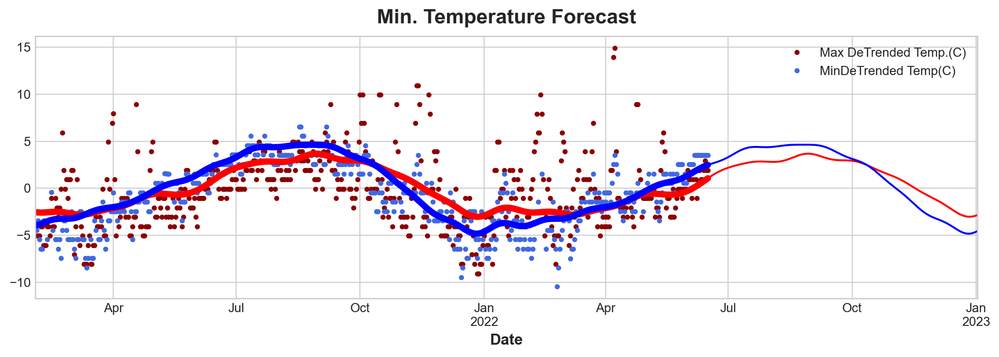

In [36]:
#Plotting detrended seasonalities
##Plotting last 500 days to clearly see the data

###Draw the scatter points
ax = y_detrended_max[-500:].plot(style=".", title="Max. Temperature Forecast", color = "darkred")
ax = y_detrended_min[-500:].plot(style=".", title="Min. Temperature Forecast", color = "royalblue")

###Drawing the historically fitted lines
ax = y_pred_max_seasonal[-500:].plot(ax = ax, label="Seasonal", linewidth=5, color="red")
ax = y_pred_min_seasonal[-500:].plot(ax = ax, label="Seasonal", linewidth=5, color="blue")

###Plotting next 200 day forecasts in red
ax = y_fore_max.plot(ax=ax, label="Seasonal Forecast", color="red")
ax = y_fore_min.plot(ax=ax, label="Seasonal Forecast", color="blue")

plt.legend(["Max DeTrended Temp.("+unit+")", f"MinDeTrended Temp({unit})"], loc=1)

In [37]:
#Deseasoning
y_deseasoned_max = y_detrended_max - y_pred_max_seasonal
y_deseasoned_min = y_detrended_min - y_pred_min_seasonal

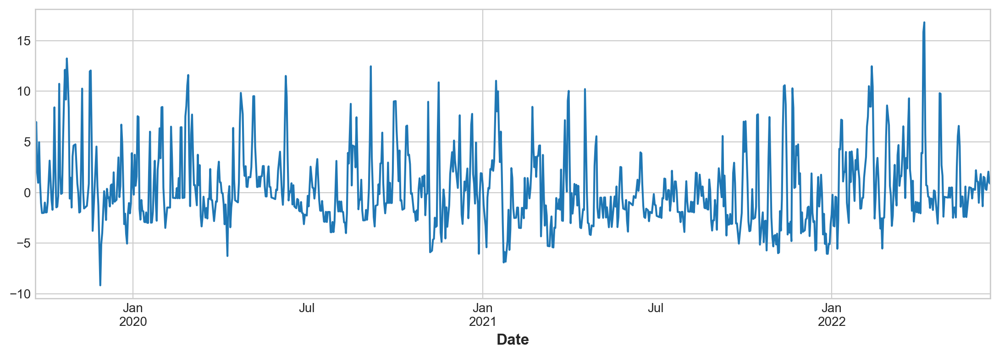

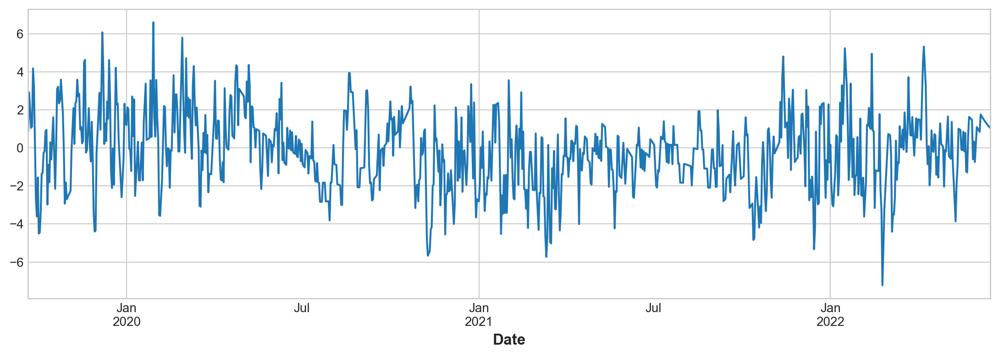

In [38]:
#Plotting last 1000 day de-trended and de-seasoned data
##max
y_deseasoned_max[-1000:].plot()
plt.show()

##min
y_deseasoned_min[-1000:].plot()
plt.show()

In [39]:
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha = 0.75,
        s = 3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws = scatter_kws,
                     line_kws = line_kws,
                     lowess = True,
                     ax = ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr :.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel = x_.name, ylabel = y_.name)
    return ax
def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags/nrows))
    kwargs.setdefault('figsize', (kwargs['ncols']*2, nrows*2+0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k+1 <= lags:
            ax = lagplot(x, y, lag=k+1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k+1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel = y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig    

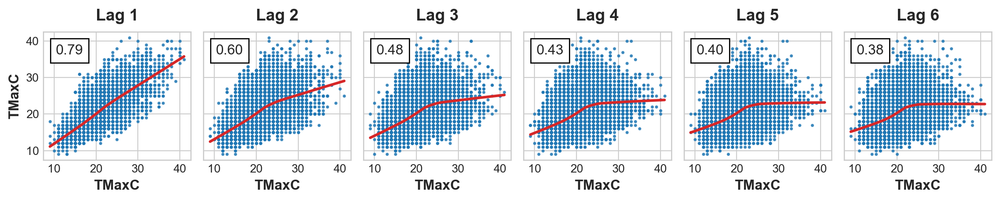

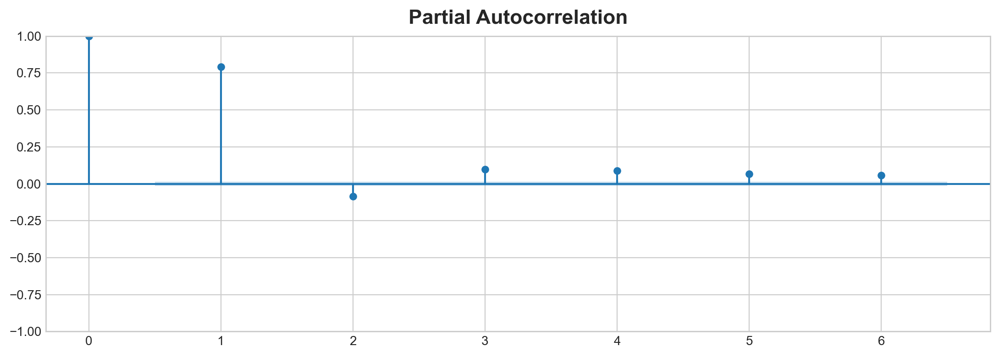

In [40]:
_ = plot_lags(weather_data["TMax"+unit])
_ = plot_pacf(weather_data["TMax"+unit], lags=6)

In [41]:
print("Mean: ", weather_data["TMax"+unit].mean())
print("Median: ", weather_data["TMax"+unit].median())

Mean:  20.989313897413414
Median:  21.0


In [42]:
print("Mean: ", weather_data["TMin"+unit].mean())
print("Median: ", weather_data["TMin"+unit].median())

Mean:  13.102093380096449
Median:  13.0


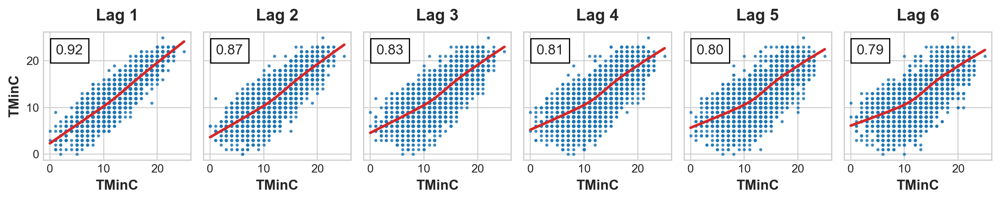

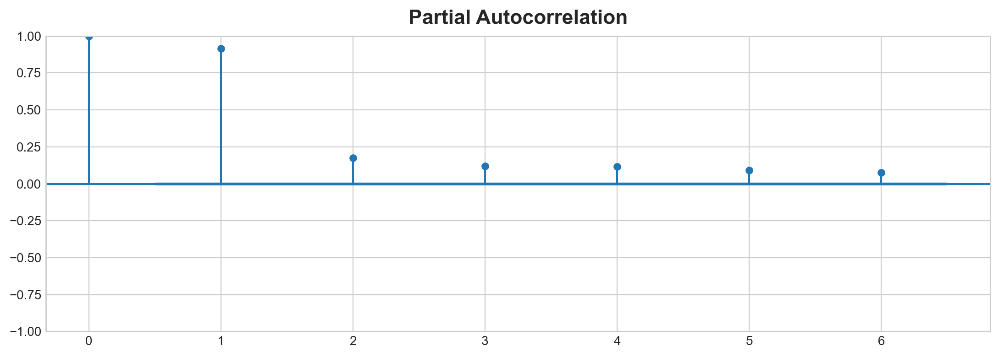

In [43]:
_ = plot_lags(weather_data["TMin"+unit])
_ = plot_pacf(weather_data["TMin"+unit], lags=6)

In [44]:
lags = pd.DataFrame()

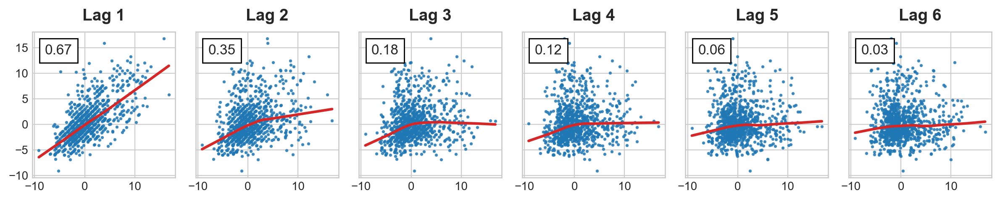

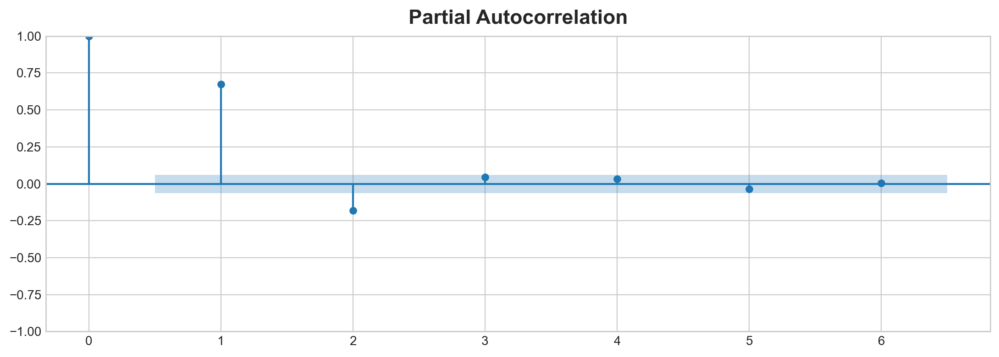

In [45]:
_ = plot_lags(y_deseasoned_max[-1000:])
_ = plot_pacf(y_deseasoned_max[-1000:], lags=6)

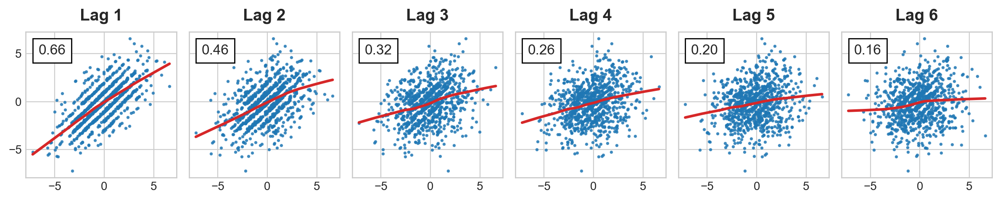

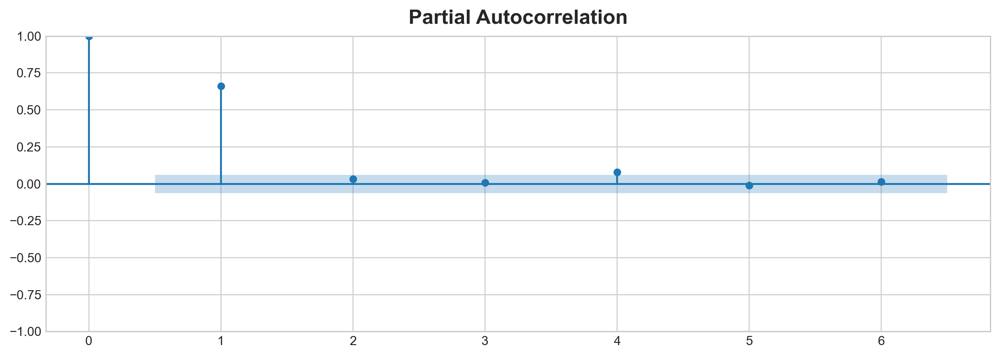

In [46]:
_ = plot_lags(y_deseasoned_min[-1000:])
_ = plot_pacf(y_deseasoned_min[-1000:], lags=6)

In [47]:
for i in range(1, 3):
    # 2 lag columns for maximum temperature will be created
    lags["Lag_"+str(i)+"max"] = y_deseasoned_max.shift(i)
for i in range(1, 3):
    # 2 lag columns for minimum temperature will be created
    lags["Lag_"+str(i)+"min"] = y_deseasoned_min.shift(i)

In [48]:
lags = lags.fillna(0.0)
lags

,Lag_1max,Lag_2max,Lag_1min,Lag_2min
Date,,,,
1972-07-01,0.000000,0.000000,0.000000,0.000000
1972-07-02,-0.998195,0.000000,0.040574,0.000000
1972-07-03,-2.044280,-0.998195,-0.039353,0.040574
1972-07-04,-2.088133,-2.044280,-0.121300,-0.039353
1972-07-05,-1.130053,-2.088133,-0.204402,-0.121300
1972-07-06,-1.170315,-1.130053,-1.287700,-0.204402
1972-07-07,-0.209156,-1.170315,-0.370177,-1.287700
1972-07-08,2.753232,-0.209156,-0.450795,-0.370177
1972-07-09,2.716711,2.753232,0.471470,-0.450795


In [49]:
y_max = y_deseasoned_max
X_train, X_test, y_train, y_test = train_test_split(lags, y_max, test_size=100, shuffle=False)
model_time_series_max = LinearRegression()
model_time_series_max.fit(X_train, y_train)
y_pred_cyclic_max = pd.Series(model_time_series_max.predict(X_train), index=y_train.index)
y_fore_cyclic_max = pd.Series(model_time_series_max.predict(X_test), index=y_test.index)
print(X_train)

             Lag_1max   Lag_2max  Lag_1min  Lag_2min
Date                                                
1972-07-01   0.000000   0.000000  0.000000  0.000000
1972-07-02  -0.998195   0.000000  0.040574  0.000000
1972-07-03  -2.044280  -0.998195 -0.039353  0.040574
1972-07-04  -2.088133  -2.044280 -0.121300 -0.039353
1972-07-05  -1.130053  -2.088133 -0.204402 -0.121300
1972-07-06  -1.170315  -1.130053 -1.287700 -0.204402
1972-07-07  -0.209156  -1.170315 -0.370177 -1.287700
1972-07-08   2.753232  -0.209156 -0.450795 -0.370177
1972-07-09   2.716711   2.753232  0.471470 -0.450795
1972-07-10  -0.318797   2.716711 -0.602409  0.471470
1972-07-11  -0.353308  -0.318797 -0.671541 -0.602409
1972-07-12   1.613223  -0.353308  0.264846 -0.671541
1972-07-13  -1.419099   1.613223 -0.792614  0.264846
1972-07-14  -1.450117  -1.419099 -0.843451 -0.792614
1972-07-15   2.520372  -1.450117  0.112628 -0.843451
1972-07-16   2.492602   2.520372  3.075729  0.112628
1972-07-17   1.466829   2.492602  3.045775  3.

In [50]:
y_min = y_deseasoned_min
X_train, X_test, y_train, y_test = train_test_split(lags, y_min, test_size=100, shuffle=False)
model_time_series_min = LinearRegression()
model_time_series_min.fit(X_train, y_train)

y_pred_cyclic_min = pd.Series(model_time_series_min.predict(X_train), index=y_train.index)
y_fore_cyclic_min = pd.Series(model_time_series_min.predict(X_test), index=y_test.index)
print(model_time_series_min.predict(X_train))
print(y_pred_cyclic_min)

[-2.87976202e-04 -1.44292552e-01 -3.23068648e-01 ... -6.74813048e-01
 -2.70438942e+00 -2.07939438e+00]
Date
1972-07-01   -0.000288
1972-07-02   -0.144293
1972-07-03   -0.323069
1972-07-04   -0.345137
1972-07-05   -0.236846
1972-07-06   -0.877836
1972-07-07   -0.311113
1972-07-08    0.185832
1972-07-09    0.571808
1972-07-10   -0.437524
1972-07-11   -0.469073
1972-07-12    0.365803
1972-07-13   -0.704017
1972-07-14   -0.723618
1972-07-15    0.457215
1972-07-16    2.018161
1972-07-17    2.096765
1972-07-18    1.400234
1972-07-19    0.618693
1972-07-20    0.388376
1972-07-21    0.417550
1972-07-22    0.414274
1972-07-23   -0.347791
1972-07-24   -0.429865
1972-07-25    0.084464
1972-07-26    0.177355
1972-07-27    0.514132
1972-07-28    0.612952
1972-07-29    0.580074
1972-07-30    2.556189
1972-07-31    2.039452
1972-08-01    1.817421
1972-08-02    2.729565
1972-08-03    2.076131
1972-08-04    0.949969
1972-08-05    0.797361
1972-08-06    0.619689
1972-08-07    2.236508
1972-08-08    2.12

In [51]:
def make_lags(ts_max, ts_min, lags, lead_time=1):
    lags_dict = {f"Lag_{i}max": ts_max.shift(i) for i in range(lead_time, lags + lead_time)}
    lags_dict.update({f"Lag_{i}min": ts_min.shift(i) for i in range(lead_time, lags + lead_time)})
    return pd.DataFrame(lags_dict).fillna(0)

In [52]:
temp = make_lags(y_deseasoned_max, y_deseasoned_min, lags=2, lead_time = 1)

In [53]:
y_cyclic_max = pd.concat([y_pred_cyclic_max, y_fore_cyclic_max])

In [54]:
y_cyclic_min = pd.concat([y_pred_cyclic_min, y_fore_cyclic_min])

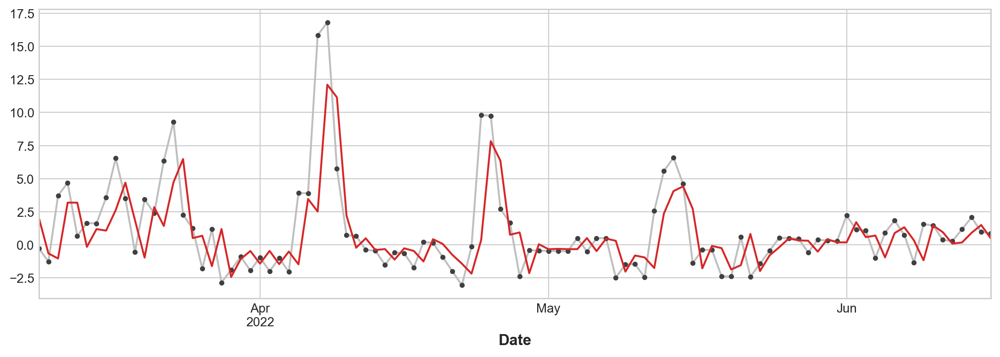

In [55]:
##Following Graph is cycles for maximum temperature data
ax = y_deseasoned_max[-100:].plot(**plot_params)
ax = y_cyclic_max[-100:].plot(ax=ax, color="C3")

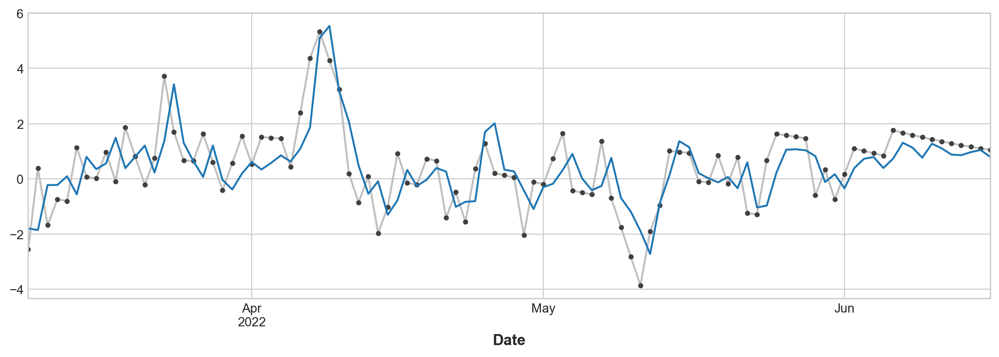

In [56]:
ax = y_deseasoned_min[-100:].plot(**plot_params) #De-seasoned minimum temperature
ax = y_cyclic_min[-100:].plot(ax=ax)

<AxesSubplot: xlabel='Date'>

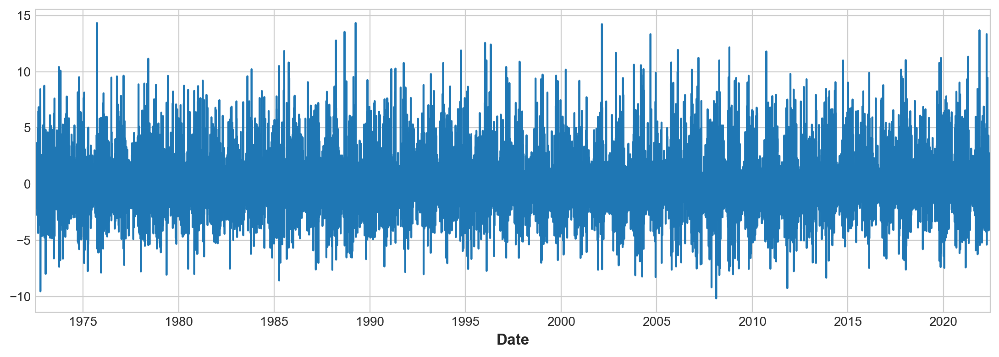

In [57]:
#Residues
y_resid_max = y_deseasoned_max - y_cyclic_max
y_resid_max.plot()  #Unpredictable error for max temp.

<AxesSubplot: xlabel='Date'>

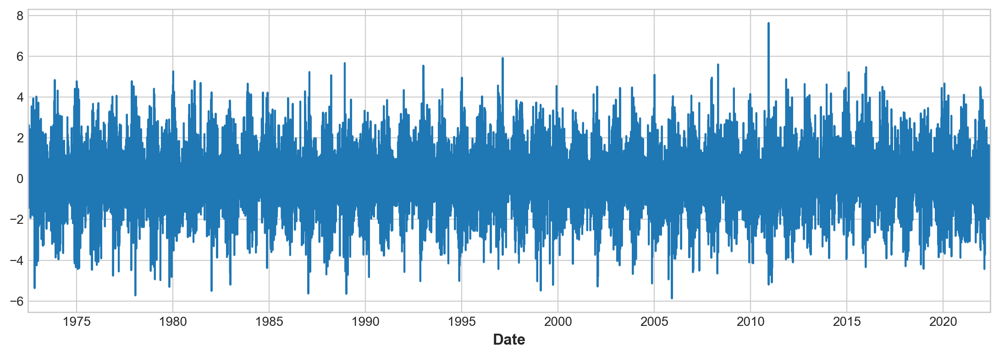

In [58]:
y_resid_min = y_deseasoned_min - y_cyclic_min
y_resid_min.plot()

In [59]:
print(y_resid_min.mean()) #Average error for min. temperature
print(y_resid_max.mean()) #Average error for max temp

0.00033441128635347675
0.0019859238041472715


In [60]:
print(y_resid_max[:2000].std())
print(y_resid_max[2000:4000].std())
print(y_resid_max[4000:6000].std())

2.336423421987782
2.3583579062432602
2.4237158237236724


In [61]:
print(y_resid_min[:2000].std())
print(y_resid_min[2000:4000].std())
print(y_resid_min[4000:6000].std())

1.4235480197631485
1.3864228957177096
1.323378280782773


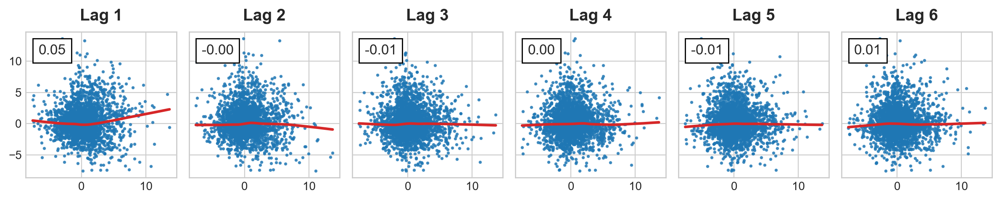

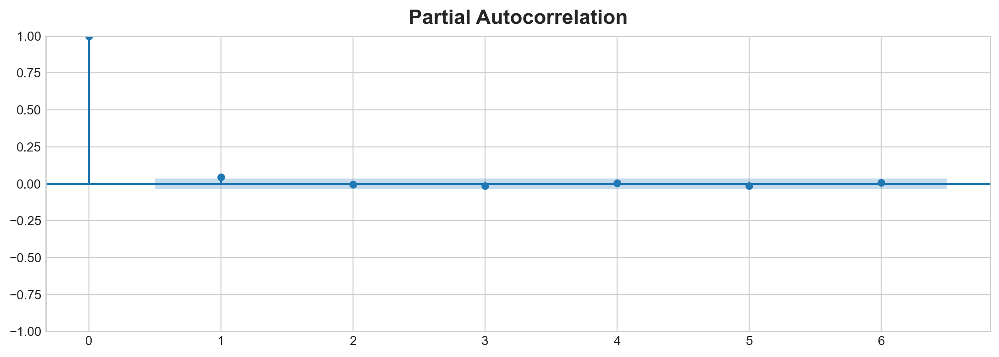

In [62]:
_ = plot_lags(y_resid_max[-3000:])
_ = plot_pacf(y_resid_max[-3000:], lags=6)

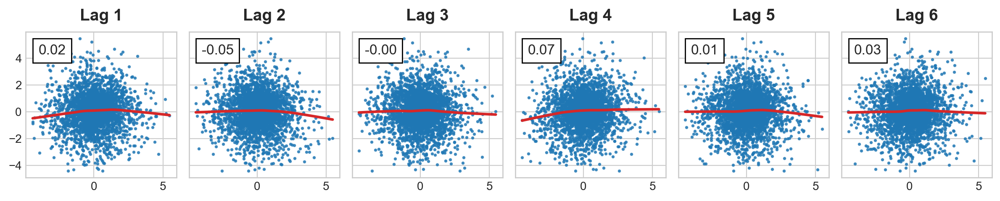

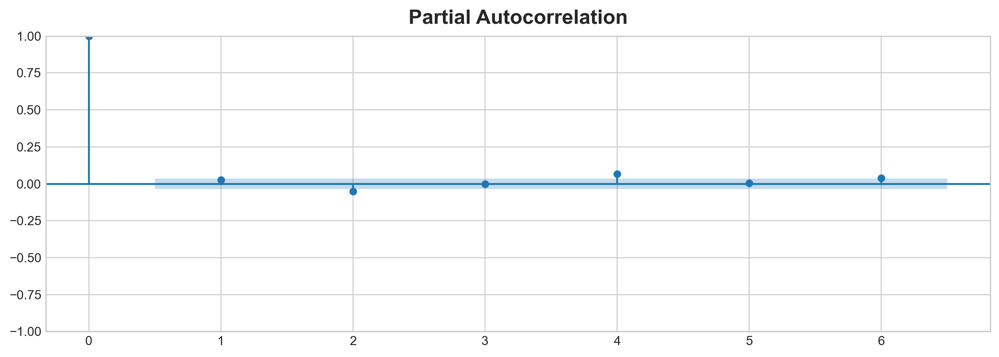

In [63]:
_ = plot_lags(y_resid_min[-3000:])
_ = plot_pacf(y_resid_min[-3000:], lags=6)

In [64]:
y = pd.concat([y_train, y_test])

In [68]:
def forecast(date = y.index[-1], n_days = 90):
    #This function makes n_days time-step forecasts with the forecast horizon of date
    forecast_results = pd.DataFrame()
    dates = [date + pd.Timedelta(days = i) for i in range(1, n_days + 1)]
    #method: predict by each model independently and then sum it up
    trend_forecast_max = pd.Series(model_max_trend.predict(dp_trend.out_of_sample(n_days)))
    seasonal_forecast_max = pd.Series(model_max_detrended_seasonal.predict(dp_seasonal.out_of_sample(n_days)))
    
    cyclic_forecast_max = pd.Series(model_time_series_max.predict(make_lags(y_deseasoned_max, y_deseasoned_min, lags=2, lead_time = 1).fillna(0)))
    forecast_max = (trend_forecast_max + seasonal_forecast_max + cyclic_forecast_max[:n_days] + y_resid_max.mean())
    forecast_results["Maximum temp. (" + unit +")"] = forecast_max
    
    trend_forecast_min = pd.Series(model_min_trend.predict(dp_trend.out_of_sample(n_days)))
    seasonal_forecast_min = pd.Series(model_min_detrended_seasonal.predict(dp_seasonal.out_of_sample(n_days)))
    cyclic_forecast_min = pd.Series(model_time_series_min.predict(make_lags(y_deseasoned_max, y_deseasoned_min, lags=2, lead_time = 1).fillna(0)))
    forecast_min = (trend_forecast_min + seasonal_forecast_min + cyclic_forecast_min[:n_days] + y_resid_min.mean())
    forecast_results["Minimum temp. (" + unit +")"] = forecast_min
    
    forecast_results.index = dates
    
    return forecast_results    

In [69]:
simplefilter("ignore")
forecast() # Make the forecasts from the model and show last 5 forecasts in the dataframe

,Maximum temp. (C),Minimum temp. (C)
2022-06-17,22.228061,15.999029
2022-06-18,21.524289,15.902806
2022-06-19,20.928491,15.770019
2022-06-20,21.136326,15.792960
2022-06-21,21.995604,15.946133
2022-06-22,21.918191,15.350758
2022-06-23,22.738938,15.964655
2022-06-24,25.063804,16.511095
2022-06-25,24.658505,16.949549
2022-06-26,22.335169,15.996210


In [70]:
datatoexcel = pd.ExcelWriter('foreCastData.xlsx')
  
# write DataFrame to excel
forecast().to_excel(datatoexcel)
  
# save the excel
datatoexcel.save()

In [71]:
predictedWeather = pd.DataFrame()
predictedWeather = forecast()